# EventGAN ASL Images to Event2Vec Classification

This notebook generates EventGAN event streams from `data/asl_dataset`, classifies the generated events with an Event2Vec checkpoint, and writes the accuracy chart plus realtime classification video.

In [2]:
from pathlib import Path
import json
import subprocess
import sys

from IPython.display import Image, Video, display

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

PROJECT_ROOT

PosixPath('/Users/zac/Desktop/Vision_AI/Vision_AI_Project')

In [3]:
SAMPLES_PER_CLASS = 8
EVENT2VEC_RUN_NAME = "eventgan_rate_quick"
GENERATED_ROOT = "EventGAN/generated_events/asl_dataset_eventgan"
OUTPUT_DIR = "EventGAN/outputs/asl_event2vec"

cmd = [
    sys.executable,
    str(PROJECT_ROOT / "scripts" / "eventgan_asl_event2vec.py"),
    "--samples-per-class", str(SAMPLES_PER_CLASS),
    "--event2vec-run-name", EVENT2VEC_RUN_NAME,
    "--event2vec-epochs", "2",
    "--event2vec-max-train-batches", "80",
    "--event2vec-max-val-batches", "20",
    "--event2vec-max-test-batches", "20",
    "--event2vec-max-tokens", "512",
    "--event2vec-batch-size", "16",
    "--eventgan-batch-size", "8",
    "--eval-batch-size", "16",
    "--video-max-samples", "24",
    "--video-frames-per-sample", "16",
    "--generated-root", GENERATED_ROOT,
    "--output-dir", OUTPUT_DIR,
]

print(" ".join(cmd))
subprocess.run(cmd, cwd=PROJECT_ROOT, check=True)

/opt/anaconda3/bin/python /Users/zac/Desktop/Vision_AI/Vision_AI_Project/scripts/eventgan_asl_event2vec.py --samples-per-class 8 --event2vec-run-name eventgan_rate_quick --event2vec-epochs 2 --event2vec-max-train-batches 80 --event2vec-max-val-batches 20 --event2vec-max-test-batches 20 --event2vec-max-tokens 512 --event2vec-batch-size 16 --eventgan-batch-size 8 --eval-batch-size 16 --video-max-samples 24 --video-frames-per-sample 16 --generated-root EventGAN/generated_events/asl_dataset_eventgan --output-dir EventGAN/outputs/asl_event2vec
Using Event2Vec checkpoint: /Users/zac/Desktop/Vision_AI/Vision_AI_Project/runs/event2vec/eventgan_rate_quick/checkpoint_best.pt
Using existing generated events under /Users/zac/Desktop/Vision_AI/Vision_AI_Project/EventGAN/generated_events/asl_dataset_eventgan
{
  "event2vec_checkpoint": "/Users/zac/Desktop/Vision_AI/Vision_AI_Project/runs/event2vec/eventgan_rate_quick/checkpoint_best.pt",
  "generated_root": "/Users/zac/Desktop/Vision_AI/Vision_AI_Pr

CompletedProcess(args=['/opt/anaconda3/bin/python', '/Users/zac/Desktop/Vision_AI/Vision_AI_Project/scripts/eventgan_asl_event2vec.py', '--samples-per-class', '8', '--event2vec-run-name', 'eventgan_rate_quick', '--event2vec-epochs', '2', '--event2vec-max-train-batches', '80', '--event2vec-max-val-batches', '20', '--event2vec-max-test-batches', '20', '--event2vec-max-tokens', '512', '--event2vec-batch-size', '16', '--eventgan-batch-size', '8', '--eval-batch-size', '16', '--video-max-samples', '24', '--video-frames-per-sample', '16', '--generated-root', 'EventGAN/generated_events/asl_dataset_eventgan', '--output-dir', 'EventGAN/outputs/asl_event2vec'], returncode=0)

In [4]:
summary_path = PROJECT_ROOT / OUTPUT_DIR / "classification_summary.json"
summary = json.loads(summary_path.read_text())

print(f"Generated-event samples: {summary['total']}")
print(f"Correct: {summary['correct']}")
print(f"Accuracy: {summary['accuracy']:.2%}")
summary["per_class"]

Generated-event samples: 192
Correct: 8
Accuracy: 4.17%


{'a': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'b': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'c': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'd': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'e': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'f': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'g': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'h': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'i': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'k': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'l': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'm': {'total': 8, 'correct': 8, 'accuracy': 1.0},
 'n': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'o': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'p': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'q': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'r': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 's': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 't': {'total': 8, 'correct': 0, 'accuracy': 0.0},
 'u': {'total': 8, 'correct': 0

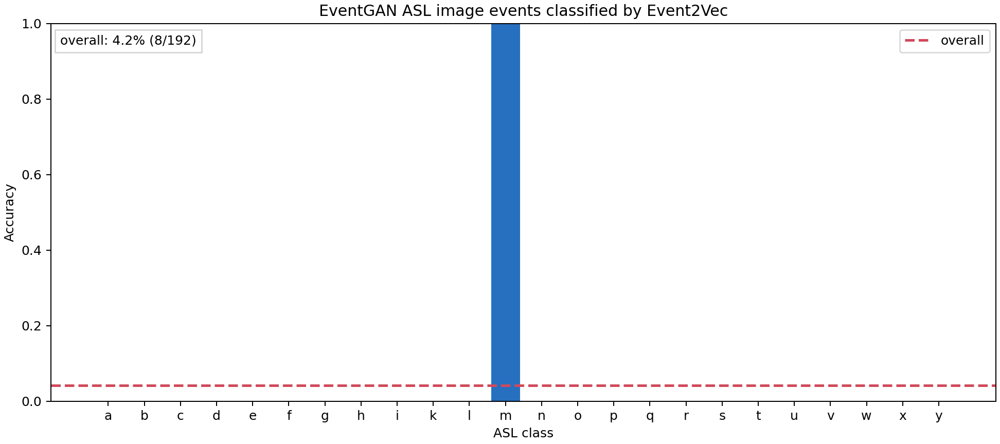

In [5]:
chart_path = PROJECT_ROOT / OUTPUT_DIR / "classification_accuracy.png"
video_path = PROJECT_ROOT / OUTPUT_DIR / "eventgan_event2vec_realtime.mp4"

display(Image(filename=str(chart_path)))
display(Video(str(video_path), embed=True, html_attributes="controls width=960"))